In [1]:
%matplotlib inline

In [2]:
import scanpy as sc
import pandas as pd
import os
import matplotlib.pyplot as plt
import mplscience
from moscot.problems.time import TemporalProblem
import ast 
    
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=300)

mplscience.available_styles()
mplscience.set_style(reset_current=True)
plt.rcParams['legend.scatterpoints'] = 1 

ImportError: cannot import name 'geodesic' from 'ott.geometry' (/home/icb/dominik.klein/miniconda3/envs/jax_gpu3/lib/python3.8/site-packages/ott/geometry/__init__.py)

In [3]:
path = "/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features"

In [4]:
output_dir = "/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/plots/driver_features"

In [5]:
tp0 = TemporalProblem.load("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/plots/OT_encodrine_analysis/TemporalProblem.pkl")

In [ ]:
tp0.adata.X = tp0.adata.layers["raw_counts"].copy()
sc.pp.normalize_total(tp0.adata)
sc.pp.log1p(tp0.adata)

In [6]:
adata_obs = pd.read_csv("/lustre/groups/ml01/workspace/moscot_paper/pancreas/adata_obs_cisBP_chromvar_features.h5ad")

In [7]:
adata.obs = adata_obs

In [8]:
paths = os.listdir(path)
paths = [os.path.join(path, el) for el in paths if "motif" in el]

In [9]:
paths

['/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_beta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_delta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_Fev_delta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_eps_prog_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_alpha_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_eps_motifs.csv']

In [10]:
def revert_to_list(x):
    x = ast.literal_eval(x["TFs"])
    return [n.strip() for n in x]

dfs = [None] * len(paths)
for i, p in enumerate(paths):
    dfs[i] = pd.read_csv(p).set_index("Unnamed: 0")
    dfs[i]["TF"] = dfs[i].apply(revert_to_list, axis=1)
    del dfs[i]["TFs"]

# Beta

In [11]:
dfs[0].head(n=20)

,Beta_pull_corr,Beta_pull_pval,Beta_pull_qval,Beta_pull_ci_low,Beta_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M08835_2.00,0.564177,1.202505e-269,3.615933e-266,0.539354,0.588020,Mafg,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M08809_2.00,0.564177,1.202505e-269,3.615933e-266,0.539354,0.588020,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M08834_2.00,0.562532,1.241658e-267,2.489111e-264,0.537643,0.586441,Maff,[Maff]
M08807_2.00,0.553100,2.475111e-256,3.721330e-253,0.527837,0.577385,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M08810_2.00,0.551909,6.166693e-255,7.417298e-252,0.526600,0.576242,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M07841_2.00,0.548370,8.019004e-251,8.037715e-248,0.522922,0.572842,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M02856_2.00,0.545536,1.441750e-247,1.238669e-244,0.519977,0.570118,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M08075_2.00,0.542035,1.348785e-243,1.013949e-240,0.516341,0.566753,NaN,"[Mafk, Mafa, Mafg, Maf, Mafb]"
M08839_2.00,0.539875,3.574529e-241,2.388579e-238,0.514098,0.564677,Maf,"[Mafk, Mafa, Mafg, Maf, Mafb]"


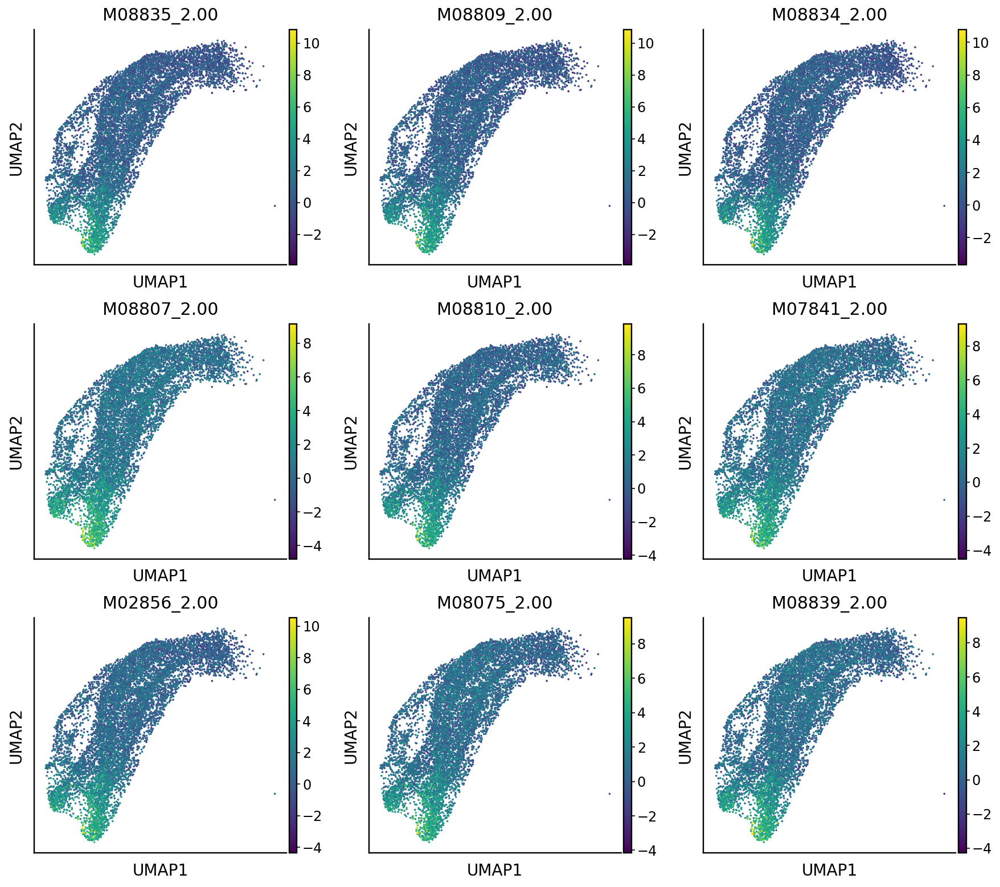

In [35]:
fig = sc.pl.umap(adata, color=dfs[0].index[:15], ncols=3, return_fig=True)

In [15]:
fig.savefig(os.path.join(output_dir, "beta_driver_motifs.png"))

In [32]:
#beta_drivers_genes = set([el for ls in dfs[0].head(n=50)["TF"].values for el in ls]).intersection(adata.var_names)

# Delta

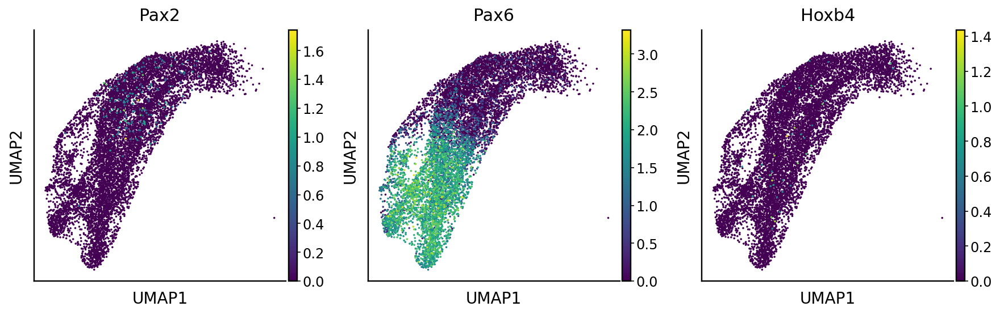

In [37]:
sc.pl.umap(adata, color=["Pax2", "Pax6", "Hoxb4"])

In [36]:
[el for el in adata.var_names if el.startswith("Hox")]

['Hoxb4']

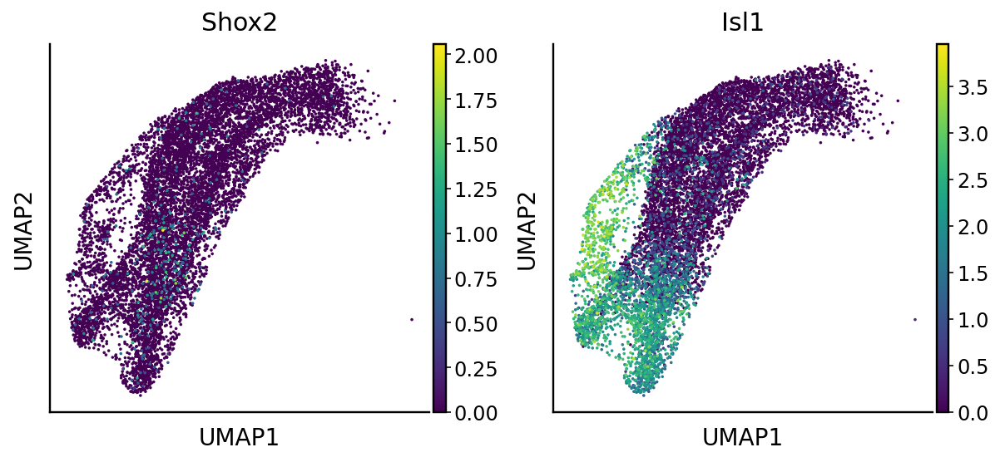

In [28]:
sc.pl.umap(adata, color=["Shox2", "Isl1"])

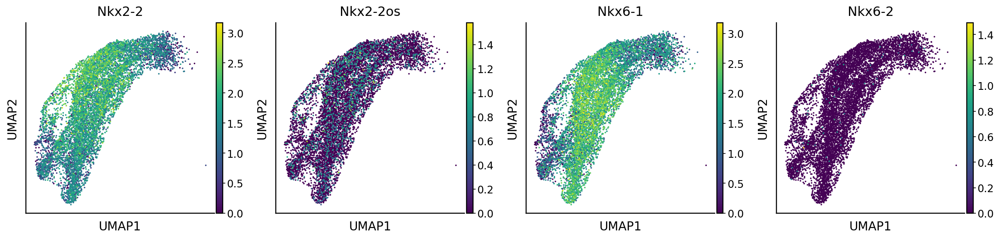

In [35]:
sc.pl.umap(adata, color=['Nkx2-2', 'Nkx2-2os', 'Nkx6-1', 'Nkx6-2'])

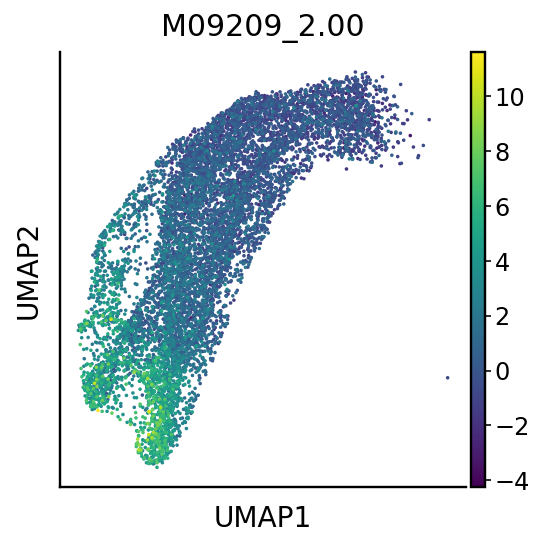

In [39]:
sc.pl.umap(adata, color="M09209_2.00")

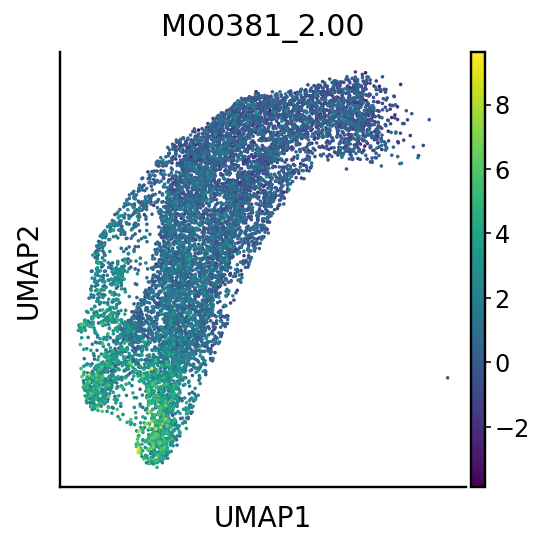

In [40]:
sc.pl.umap(adata, color="M00381_2.00")

In [32]:
dfs[1].head(n=30)

,Delta_pull_corr,Delta_pull_pval,Delta_pull_qval,Delta_pull_ci_low,Delta_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M09209_2.00,0.411525,4.001885e-183,1.203367e-179,0.386548,0.435898,Isl1,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M09128_2.00,0.411525,4.001885e-183,1.203367e-179,0.386548,0.435898,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M05204_2.00,0.355137,1.661457e-132,3.330668e-129,0.328905,0.380821,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M03291_2.00,0.343129,4.544313e-123,6.832375e-120,0.316654,0.369069,NaN,"[Pax2, Pax6]"
M00381_2.00,0.339795,1.581686e-120,1.585377e-117,0.313256,0.365805,Hoxb6,"[Hoxb6, Hoxa10, Hoxa4, Mnx1, Hoxc8, Hoxc6, Hox..."
M04910_2.00,0.339128,5.054062e-120,3.799391e-117,0.312576,0.365152,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M04909_2.00,0.339128,5.054062e-120,3.799391e-117,0.312576,0.365152,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M04908_2.00,0.336015,1.099590e-117,4.408623e-115,0.309402,0.362103,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M03900_2.00,0.318944,2.267204e-105,2.840618e-103,0.292009,0.345373,NaN,[Pax6]


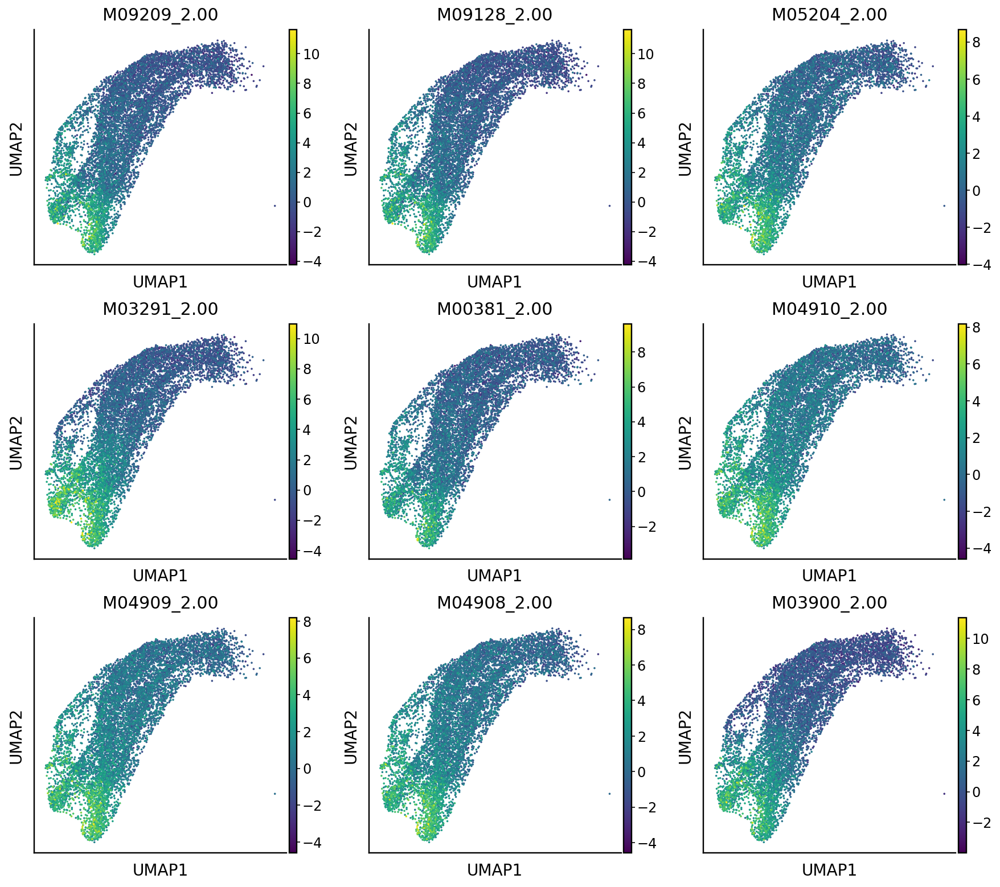

In [39]:
fig = sc.pl.umap(adata, color=dfs[1].index[:15], ncols=3, return_fig=True)

In [40]:
fig.savefig(os.path.join(output_dir, "fev_delta_driver_motifs.png"))

# Fev+ Delta

In [41]:
dfs[2].head()

,Fev_delta_pull_corr,Fev_delta_pull_pval,Fev_delta_pull_qval,Fev_delta_pull_ci_low,Fev_delta_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M09975_2.00,0.164477,1.058360e-31,6.364979e-28,0.137343,0.191364,NaN,"[Bach1, Bach2]"
M08067_2.00,0.161420,1.413194e-30,4.249475e-27,0.134260,0.188337,NaN,"[Jun, Junb, Jund]"
M07816_2.00,0.152755,1.655168e-27,3.273379e-24,0.125527,0.179754,NaN,"[Jun, Junb, Jund]"
M07827_2.00,0.152409,2.177173e-27,3.273379e-24,0.125177,0.179411,NaN,"[Fosb, Fos, Fosl1, Fosl2]"
M08073_2.00,0.151335,5.068503e-27,6.096396e-24,0.124095,0.178347,NaN,"[Jun, Junb, Jund]"


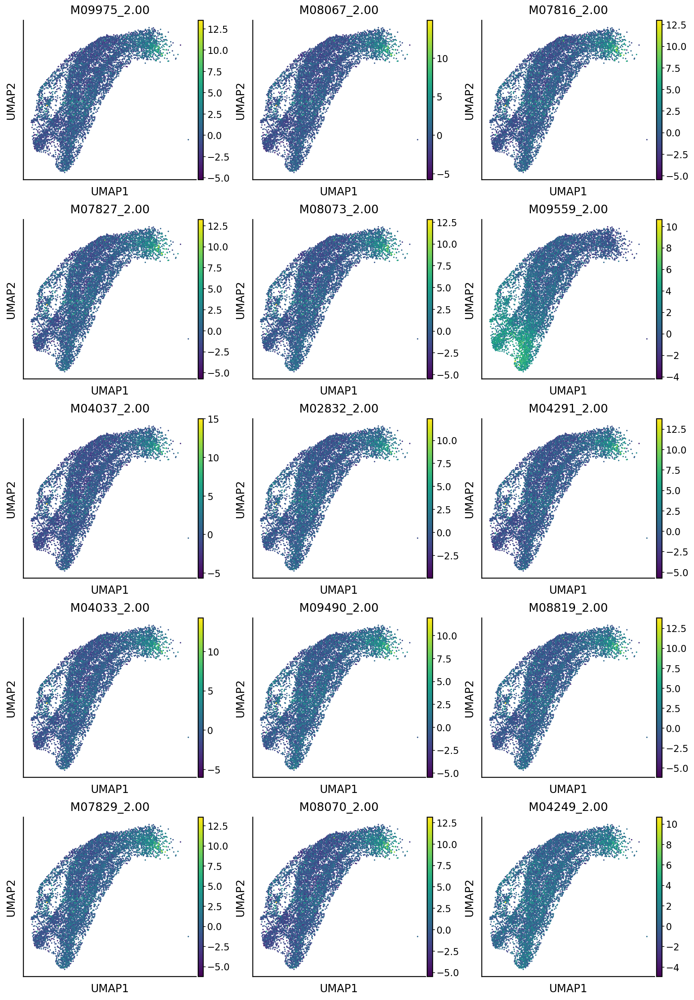

In [42]:
fig = sc.pl.umap(adata, color=dfs[2].index[:15], ncols=3, return_fig=True)

In [15]:
fig.savefig(os.path.join(output_dir, "fev_delta_driver_motifs.png"))

# Eps. prog.

In [46]:
dfs[3].head()

,Eps_prog_pull_corr,Eps_prog_pull_pval,Eps_prog_pull_qval,Eps_prog_pull_ci_low,Eps_prog_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M03479_2.00,0.100682,9.992973e-13,1.717078e-10,0.073125,0.128085,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03480_2.00,0.100017,1.408427e-12,2.352855e-10,0.072457,0.127424,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03478_2.00,0.098992,2.380981e-12,3.768216e-10,0.071427,0.126405,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03475_2.00,0.098481,3.087159e-12,4.760557e-10,0.070914,0.125898,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M05747_2.00,0.096162,9.862349e-12,1.446638e-09,0.068585,0.123593,NaN,"[Nfix, Nfib, Nfia, Nfic]"


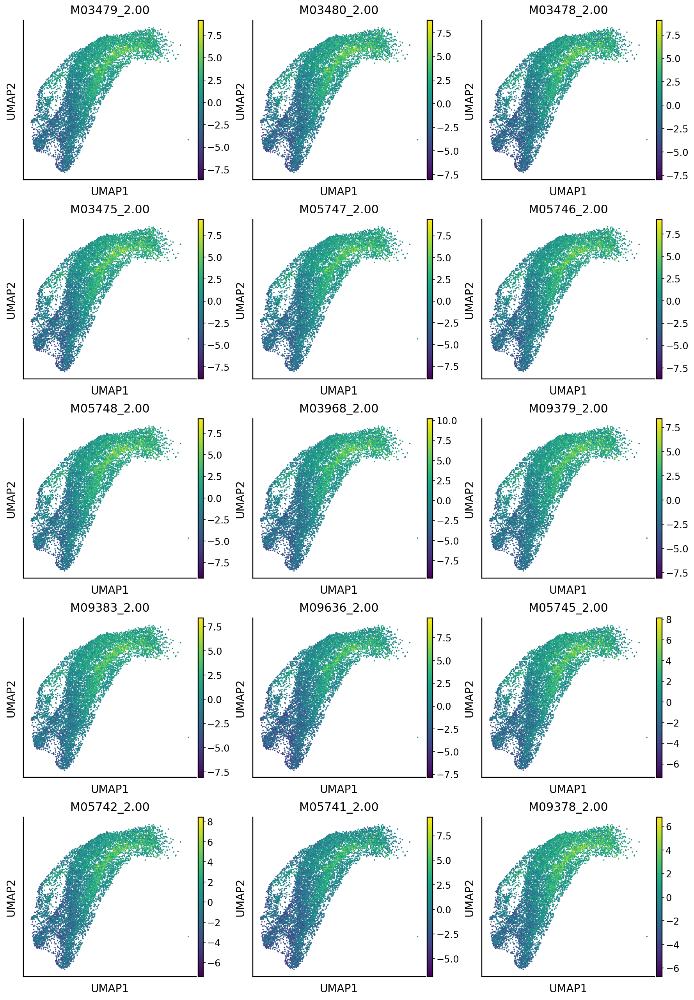

In [43]:
fig = sc.pl.umap(adata, color=dfs[3].index[:15], ncols=3, return_fig=True)

In [17]:
fig.savefig(os.path.join(output_dir, "eps_prog_driver_motifs.png"))

# Alpha

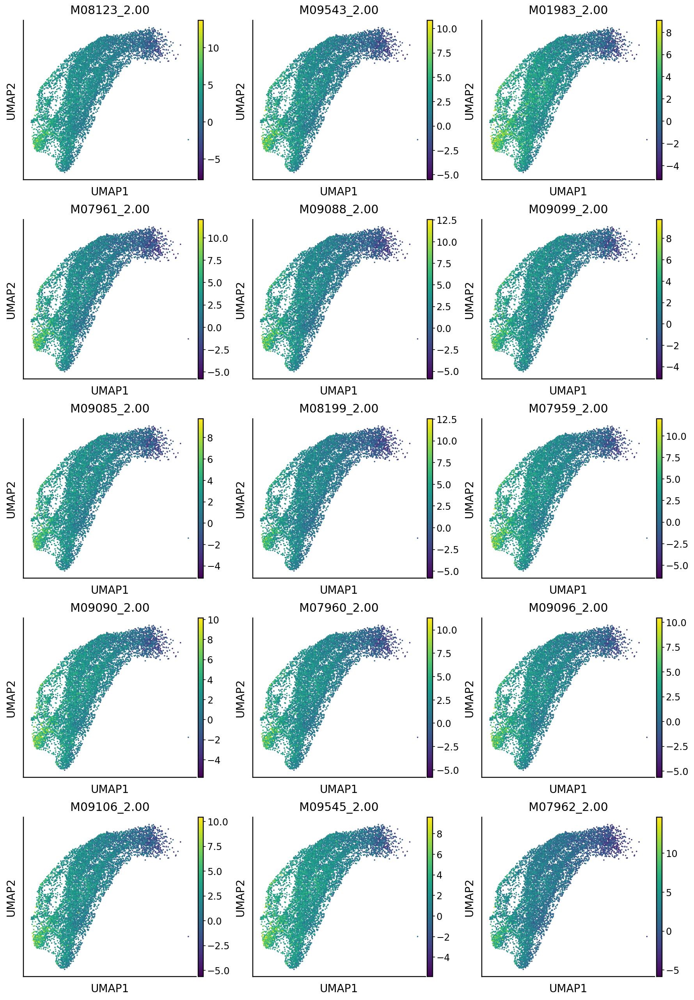

In [47]:
fig = sc.pl.umap(adata, color=dfs[4].index[:15], ncols=3, return_fig=True)

In [19]:
fig.savefig(os.path.join(output_dir, "alpha_driver_motifs.png"))

# Epsilon

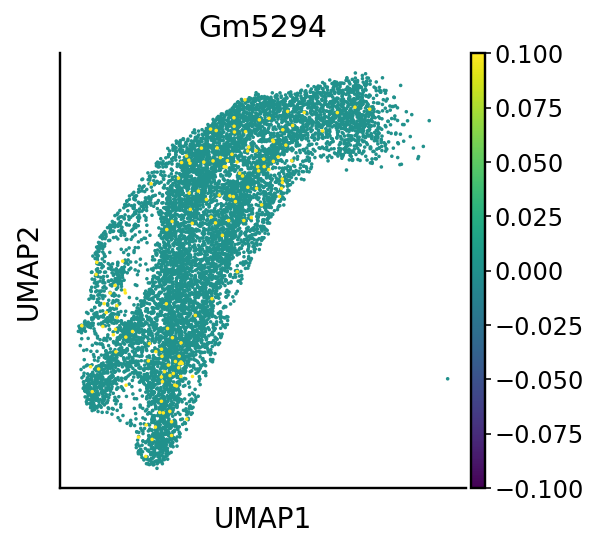

In [15]:
sc.pl.umap(adata, color="Gm5294", vmax="p95")

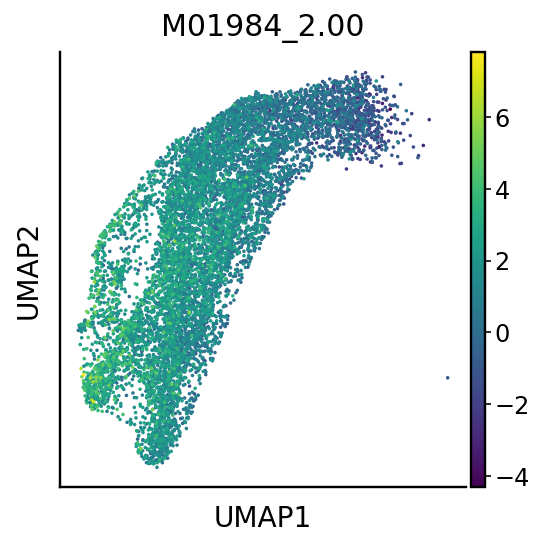

In [38]:
sc.pl.umap(adata, color="M01984_2.00")

In [13]:
dfs[5].head(n=20)

,Epsilon_pull_corr,Epsilon_pull_pval,Epsilon_pull_qval,Epsilon_pull_ci_low,Epsilon_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M09128_2.00,0.223125,9.511563e-58,2.860127e-54,0.196582,0.249342,NaN,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M09209_2.00,0.223125,9.511563e-58,2.860127e-54,0.196582,0.249342,Isl1,"[Sebox, Shox2, Isl2, Vsx1, Isl1, Noto]"
M03030_2.00,0.205078,8.246654e-49,1.653179e-45,0.178333,0.231521,NaN,"[Foxa1, Foxa2, Foxa3, Foxb2, Foxb1]"
M09090_2.00,0.201024,6.440260e-47,9.682931e-44,0.174236,0.227516,NaN,"[Foxa1, Foxa2, Foxa3, Foxb1]"
M00665_2.00,0.200505,1.117384e-46,1.066556e-43,0.173711,0.227003,NaN,"[Foxb2, Foxb1]"
M01984_2.00,0.200406,1.241419e-46,1.066556e-43,0.173611,0.226905,Gm5294,"[Foxg1, Foxf2, Foxf1, Foxe3, Foxc2, Foxi1, Fox..."
M09545_2.00,0.199525,3.149797e-46,2.367860e-43,0.172721,0.226034,NaN,"[Foxa1, Foxa2, Foxa3, Foxb1]"
M03031_2.00,0.199376,3.687769e-46,2.464249e-43,0.172570,0.225886,NaN,"[Foxa1, Foxa2, Foxa3, Foxb2, Foxb1]"
M09103_2.00,0.198014,1.540267e-45,9.263165e-43,0.171194,0.224540,Foxa1,"[Foxa1, Foxa2, Foxa3, Foxb1]"


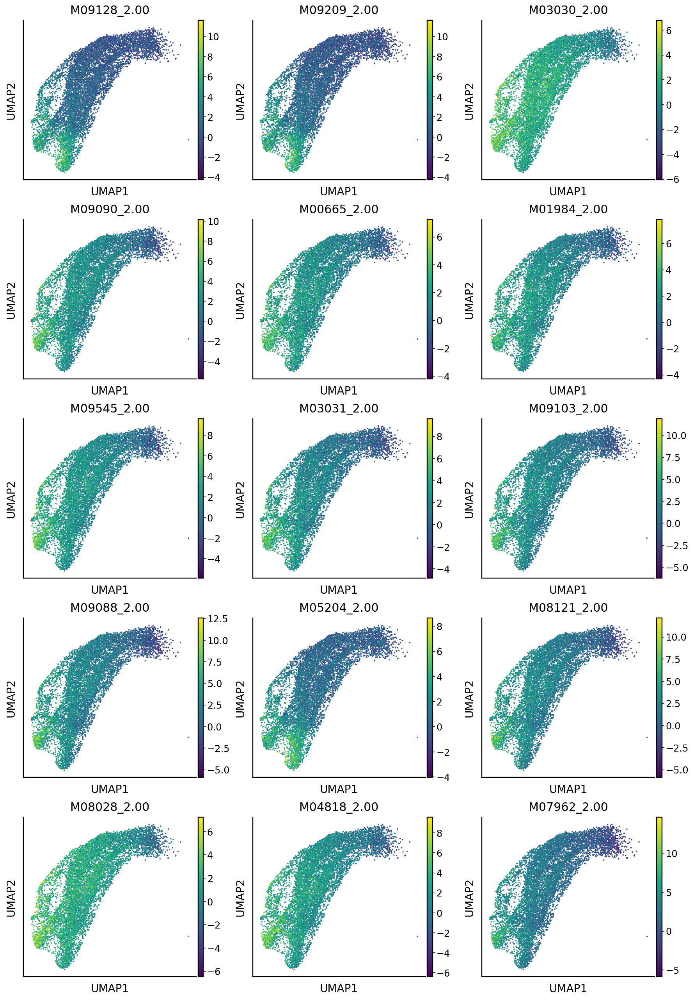

In [48]:
fig = sc.pl.umap(adata, color=dfs[5].index[:15], ncols=3, return_fig=True)

In [21]:
fig.savefig(os.path.join(output_dir, "eps_driver_motifs.png"))